In [1]:
import pandas as pd
import numpy as np


In [2]:
Prices_raw= pd.read_csv('../data/Prices.csv', encoding='utf-8',thousands=',')
Export_Import_raw = pd.read_csv('../data/Cross_Border.csv',encoding='utf-8',thousands=',')
Consumption_raw = pd.read_csv('../data/Cosumption.csv',encoding='utf-8',thousands=',')
Generation_raw = pd.read_csv('../data/Generation.csv',encoding='utf-8',thousands=',')

In [3]:
Prices_raw['Start'] = Prices_raw['Unnamed: 0']
Consumption_raw['Start'] = Consumption_raw['Unnamed: 0']
Generation_raw['Start'] = Generation_raw['Unnamed: 0']
Export_Import_raw['Start'] = Export_Import_raw['Unnamed: 0']

In [4]:
Prices_raw['Start'] = pd.to_datetime(Prices_raw['Start'])
Prices_raw = Prices_raw.set_index('Start')
Export_Import_raw['Start'] = pd.to_datetime(Export_Import_raw['Start'])
Export_Import_raw = Export_Import_raw.set_index('Start')
Consumption_raw['Start'] = pd.to_datetime(Consumption_raw['Start'])
Consumption_raw = Consumption_raw.set_index('Start')
Generation_raw['Start'] = pd.to_datetime(Generation_raw['Start'])
Generation_raw = Generation_raw.set_index('Start')

In [5]:
Generation_raw.rename(inplace= True, columns={
    'Biomass [MWh] Original resolutions':'Biomass',
       'Hydropower [MWh] Original resolutions':'Hydropower',
       'Wind offshore [MWh] Original resolutions':'Wind_offshore',
       'Wind onshore [MWh] Original resolutions':'Wind_onshore',
       'Photovoltaics [MWh] Original resolutions':'Photovoltaics',
       'Other renewable [MWh] Original resolutions':'Other_renewable',
       'Nuclear [MWh] Original resolutions':'Nuclear',
       'Lignite [MWh] Original resolutions':'Lignite',
       'Hard coal [MWh] Original resolutions':'Hard_coal',
       'Fossil gas [MWh] Original resolutions':'Fossil_gas',
       'Hydro pumped storage [MWh] Original resolutions':'Hydro_pumped_storage',
       'Other conventional [MWh] Original resolutions':'Other_conventional',
         'Sum [MWh]':'Sum'
})



In [6]:
Consumption_raw.rename(inplace=True, columns={
    'Total (grid load) [MWh] Original resolutions':'Total',
       'Residual load [MWh] Original resolutions':'Residual',
       'Hydro pumped storage [MWh] Original resolutions':'Hydro'
})


In [7]:
Prices_raw.rename(inplace=True, columns={
    'Germany/Luxembourg [€/MWh] Calculated resolutions':'Germany_Luxembourg',
       'Belgium [€/MWh] Calculated resolutions':'Belgium',
       'France [€/MWh] Calculated resolutions':'France',
       'Austria [€/MWh] Calculated resolutions':'Austria',
       'Poland [€/MWh] Calculated resolutions':'Poland',
       'Czech Republic [€/MWh] Calculated resolutions':'Czech_Republic',
       'Switzerland [€/MWh] Calculated resolutions':'Switzerland',
})

In [8]:
Export_Import_raw['Belgium_sum'] = Export_Import_raw['Belgium (export) [MWh] Original resolutions'] + Export_Import_raw['Belgium (import) [MWh] Original resolutions']
Export_Import_raw['France_sum'] = Export_Import_raw['France (export) [MWh] Original resolutions'] + Export_Import_raw['France (import) [MWh] Original resolutions']
Export_Import_raw['Poland_sum'] = Export_Import_raw['Poland (export) [MWh] Original resolutions'] + Export_Import_raw['Poland (import) [MWh] Original resolutions']
Export_Import_raw['Austria_sum'] = Export_Import_raw['Austria (export) [MWh] Original resolutions'] + Export_Import_raw['Austria (import) [MWh] Original resolutions']
Export_Import_raw['Czech_Republic_sum'] = Export_Import_raw['Czech Republic (export) [MWh] Original resolutions'] + Export_Import_raw['Czech Republic (import) [MWh] Original resolutions']
Export_Import_raw['Switzerland_sum'] = Export_Import_raw['Switzerland (export) [MWh] Original resolutions'] + Export_Import_raw['Switzerland (import) [MWh] Original resolutions']
Export_Import_raw['Remainder_sum'] = Export_Import_raw['Sum [MWh]']-Export_Import_raw['Switzerland_sum'] - Export_Import_raw['Austria_sum'] - Export_Import_raw['Poland_sum'] - Export_Import_raw['France_sum'] - Export_Import_raw['Belgium_sum']

In [9]:
Export_Import_raw.rename(inplace=True, columns={
    'Sum [MWh]':'Total_sum'
})

Drop the other columns: 


In [10]:
Generation = Generation_raw.drop(columns=['Unnamed: 0','End date'])
Consumption = Consumption_raw.drop(columns= ['Unnamed: 0','End date'])
Prices = Prices_raw.drop(columns=
        ['Unnamed: 0','End date','Denmark 1 [€/MWh] Calculated resolutions',
       'Denmark 2 [€/MWh] Calculated resolutions',
       'Netherlands [€/MWh] Calculated resolutions',
       'Norway 2 [€/MWh] Calculated resolutions',
       'Sweden 4 [€/MWh] Calculated resolutions', 
       'Northern Italy [€/MWh] Calculated resolutions',
       'Slovenia [€/MWh] Calculated resolutions',
       'Hungary [€/MWh] Calculated resolutions'
       ])
Export_Import = Export_Import_raw.drop(columns=
        ['Unnamed: 0','End date', 'Netherlands (export) [MWh] Original resolutions',
       'Netherlands (import) [MWh] Original resolutions',
       'Switzerland (export) [MWh] Original resolutions',
       'Switzerland (import) [MWh] Original resolutions',
       'Denmark (export) [MWh] Original resolutions',
       'Denmark (import) [MWh] Original resolutions',
       'Czech Republic (export) [MWh] Original resolutions',
       'Czech Republic (import) [MWh] Original resolutions',
       'Luxembourg (export) [MWh] Original resolutions',
       'Luxembourg (import) [MWh] Original resolutions',
       'Sweden (export) [MWh] Original resolutions',
       'Sweden (import) [MWh] Original resolutions',
       'Austria (export) [MWh] Original resolutions',
       'Austria (import) [MWh] Original resolutions',
       'France (export) [MWh] Original resolutions',
       'France (import) [MWh] Original resolutions',
       'Poland (export) [MWh] Original resolutions',
       'Poland (import) [MWh] Original resolutions',
       'Norway (export) [MWh] Original resolutions',
       'Norway (import) [MWh] Original resolutions',
       'Belgium (export) [MWh] Original resolutions',
       'Belgium (import) [MWh] Original resolutions'
       ])

In [11]:
Prices

,Germany_Luxembourg,Belgium,France,Austria,Poland,Switzerland,Czech_Republic
Start,,,,,,,
2015-01-01 00:00:00,0.00,36.56,36.56,0.00,NaN,44.94,26.48
2015-01-01 00:15:00,0.00,36.56,36.56,0.00,NaN,44.94,26.48
2015-01-01 00:30:00,0.00,36.56,36.56,0.00,NaN,44.94,26.48
2015-01-01 00:45:00,0.00,36.56,36.56,0.00,NaN,44.94,26.48
2015-01-01 01:00:00,0.00,36.56,36.56,0.00,NaN,43.43,24.20
...,...,...,...,...,...,...,...
2024-05-24 15:45:00,88.18,81.25,35.01,79.07,96.53,83.90,83.09
2024-05-24 16:00:00,84.27,84.11,38.50,84.74,106.81,86.14,84.27
2024-05-24 16:15:00,84.27,84.11,38.50,84.74,106.81,86.14,84.27


| Generation           |       | Consumption          |       | Prices             |         | Cross-Border    |       |
|----------------------|-------|----------------------|-------|--------------------|---------|-----------------|-------|
|                      |       |                      |       |                    |         |                 |       |
| Column               | Unit  | Column               | Unit  | Column             | Unit    | Column         | Unit  |
| Biomass              | [MWh] | Total                | [MWh] | Germany_Luxembourg | [€/MWh] | Sum             | [MWh] |
| Hydropower           | [MWh] | Residual             | [MWh] | Belgium            | [€/MWh] | Belgium_sum     | [MWh] |
| Wind_offshore        | [MWh] | Hydro_pumped_storage | [MWh] | France             | [€/MWh] | France_sum      | [MWh] |
| Wind_onshore         | [MWh] |                      |       | Poland             | [€/MWh] | Poland_sum      | [MWh] |
| Photovoltaics        | [MWh] |                      |       | Austria            | [€/MWh] | Austrian_sum    | [MWh] |
| Other_renewable      | [MWh] |                      |       | Switzerland        | [€/MWh] | Switzerland_sum | [MWh] |
| Nuclear              | [MWh] |                      |       | Czech_Republic     | [€/MWh] |Czech_Republic_sum| [MWh] |
| Lignite              | [MWh] |                      |       |                    |         |                 |       |
| Hard_coal            | [MWh] |                      |       |                    |         |                 |       |
| Fossil_gas           | [MWh] |                      |       |                    |         |                 |       |
| Hydro_pumped_storage | [MWh] |                      |       |                    |         |                 |       |
| Other_conventional   | [MWh] |                      |       |                    |         |                 |       |
| Sum                  | [MWh] |                      |       |                    |         |                 |       |

## EDA - Consumption

In [12]:
Consumption.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 329444 entries, 2015-01-01 00:00:00 to 2024-05-24 16:45:00
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Total     329444 non-null  float64
 1   Residual  329444 non-null  float64
 2   Hydro     329444 non-null  float64
dtypes: float64(3)
memory usage: 10.1 MB


In [13]:
Generation.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 329444 entries, 2015-01-01 00:00:00 to 2024-05-24 16:45:00
Data columns (total 13 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Biomass               329444 non-null  float64
 1   Hydropower            329444 non-null  float64
 2   Wind_offshore         329444 non-null  float64
 3   Wind_onshore          329444 non-null  float64
 4   Photovoltaics         329444 non-null  float64
 5   Other_renewable       329444 non-null  float64
 6   Nuclear               329444 non-null  float64
 7   Lignite               329444 non-null  float64
 8   Hard_coal             329444 non-null  float64
 9   Fossil_gas            329444 non-null  float64
 10  Hydro_pumped_storage  329444 non-null  float64
 11  Other_conventional    329444 non-null  float64
 12  Sum                   329444 non-null  float64
dtypes: float64(13)
memory usage: 35.2 MB


In [14]:
Prices.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 329444 entries, 2015-01-01 00:00:00 to 2024-05-24 16:45:00
Data columns (total 7 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Germany_Luxembourg  329444 non-null  float64
 1   Belgium             329444 non-null  float64
 2   France              329444 non-null  float64
 3   Austria             329444 non-null  float64
 4   Poland              215376 non-null  float64
 5   Switzerland         329444 non-null  float64
 6   Czech_Republic      329444 non-null  float64
dtypes: float64(7)
memory usage: 20.1 MB


In [15]:
Export_Import.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 329444 entries, 2015-01-01 00:00:00 to 2024-05-24 16:45:00
Data columns (total 8 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Total_sum           329444 non-null  float64
 1   Belgium_sum         329444 non-null  float64
 2   France_sum          329444 non-null  float64
 3   Poland_sum          329444 non-null  float64
 4   Austria_sum         329444 non-null  float64
 5   Czech_Republic_sum  329444 non-null  float64
 6   Switzerland_sum     329444 non-null  float64
 7   Remainder_sum       329444 non-null  float64
dtypes: float64(8)
memory usage: 22.6 MB


### Trend-Seasonal Decomposition

In [16]:
from statsmodels.tsa.seasonal import seasonal_decompose 
import statsmodels.api as sm

In [45]:
Total_Consumption_monthly = pd.DataFrame(data = Consumption['Total'], index= Consumption.index)
Total_Consumption_monthly.reset_index(inplace=True)

Total_Consumption_monthly['Start'] = pd.to_datetime(Total_Consumption_monthly['Start'])
Total_Consumption_monthly.set_index('Start', inplace=True)
Total_Consumption_monthly= Total_Consumption_monthly.asfreq('M')
decomposition_Consumption = seasonal_decompose(Total_Consumption_monthly, model='additive')

Total_Consumption_monthly['Trend'] = decomposition_Consumption.trend
Total_Consumption_monthly['Seasonal'] = decomposition_Consumption.seasonal
Total_Consumption_monthly['Residual'] = decomposition_Consumption.resid

In [52]:
Total_Generation_monthly = pd.DataFrame(data = Generation['Sum'], index= Generation.index)
Total_Generation_monthly.reset_index(inplace=True)

Total_Generation_monthly['Start'] = pd.to_datetime(Total_Generation_monthly['Start'])
Total_Generation_monthly.set_index('Start', inplace=True)
Total_Generation_monthly= Total_Generation_monthly.asfreq('M')
decomposition_Generation = seasonal_decompose(Total_Generation_monthly, model='additive')

Total_Generation_monthly['Trend'] = decomposition_Generation.trend
Total_Generation_monthly['Seasonal'] = decomposition_Generation.seasonal
Total_Generation_monthly['Residual'] = decomposition_Generation.resid

In [59]:
Prices_monthly = pd.DataFrame(data = Prices['Germany_Luxembourg'], index= Prices.index)
Prices_monthly.reset_index(inplace=True)

Prices_monthly['Start'] = pd.to_datetime(Prices_monthly['Start'])
Prices_monthly.set_index('Start', inplace=True)
Prices_monthly= Prices_monthly.asfreq('M')
decomposition_Prices = seasonal_decompose(Prices_monthly, model='additive')

Prices_monthly['Trend'] = decomposition_Prices.trend
Prices_monthly['Seasonal'] = decomposition_Prices.seasonal
Prices_monthly['Residual'] = decomposition_Prices.resid

In [46]:
Total_Consumption_hourly = pd.DataFrame(data = Consumption['Total'], index= Consumption.index)
Total_Consumption_hourly.reset_index(inplace=True)

Total_Consumption_hourly['Start'] = pd.to_datetime(Total_Consumption_hourly['Start'])
Total_Consumption_hourly.set_index('Start', inplace=True)
Total_Consumption_hourly= Total_Consumption_hourly.asfreq('H')
decomposition_Consumption = seasonal_decompose(Total_Consumption_hourly, model='additive')

Total_Consumption_hourly['Trend'] = decomposition_Consumption.trend
Total_Consumption_hourly['Seasonal'] = decomposition_Consumption.seasonal
Total_Consumption_hourly['Residual'] = decomposition_Consumption.resid

In [47]:
Total_Consumption_dayly = pd.DataFrame(data = Consumption['Total'], index= Consumption.index)
Total_Consumption_dayly.reset_index(inplace=True)

Total_Consumption_dayly['Start'] = pd.to_datetime(Total_Consumption_dayly['Start'])
Total_Consumption_dayly.set_index('Start', inplace=True)
Total_Consumption_dayly= Total_Consumption_dayly.asfreq('M')
decomposition_Consumption = seasonal_decompose(Total_Consumption_dayly, model='additive')

Total_Consumption_dayly['Trend'] = decomposition_Consumption.trend
Total_Consumption_dayly['Seasonal'] = decomposition_Consumption.seasonal
Total_Consumption_dayly['Residual'] = decomposition_Consumption.resid

In [36]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import seaborn as sns


In [50]:
cols = ["Trend", "Seasonal", "Residual"]

fig = make_subplots(rows=3, cols=1, subplot_titles=cols)

for i, col in enumerate(cols):
    fig.add_trace(
        go.Scatter(x=Total_Consumption_monthly.index, y=Total_Consumption_monthly[col]),
        row=i+1,
        col=1
    )

fig.update_layout(height=800, width=1200, showlegend=False)
fig.show()

In [49]:
cols = ["Trend", "Seasonal", "Residual"]

fig = make_subplots(rows=3, cols=1, subplot_titles=cols)

for i, col in enumerate(cols):
    fig.add_trace(
        go.Scatter(x=Total_Consumption_dayly.index, y=Total_Consumption_dayly[col]),
        row=i+1,
        col=1
    )

fig.update_layout(height=800, width=1200, showlegend=False)
fig.show()

In [48]:
cols = ["Trend", "Seasonal", "Residual"]

fig = make_subplots(rows=3, cols=1, subplot_titles=cols)

for i, col in enumerate(cols):
    fig.add_trace(
        go.Scatter(x=Total_Consumption_hourly.index, y=Total_Consumption_hourly[col]),
        row=i+1,
        col=1
    )

fig.update_layout(height=800, width=1200, showlegend=False)
fig.show()

In [42]:
fig = px.line(Total_Consumption, x=Total_Consumption.index, y="Total",)
fig.update_layout(
    yaxis_title="Consumption in MWh", 
    xaxis_title="Year",
    legend_title="", 
    title="Monthly Total Consumption"
)
fig.show()

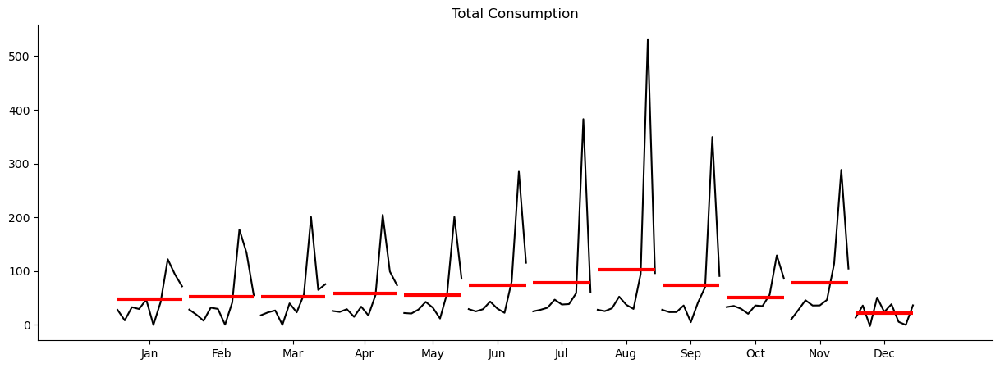

In [61]:
from statsmodels.graphics.tsaplots import month_plot

plt.figure(figsize=(15, 5))

# create the seasonal plot
# month_plot(Total_Consumption_monthly['Total'], ax=plt.gca())
#month_plot(Total_Generation_monthly['Sum'], ax = plt.gca())
month_plot(Prices_monthly['Germany_Luxembourg'], ax = plt.gca())
plt.title("Total Consumption")


sns.despine()
plt.show()